## Data Analysis on AirBNB Customer Data ##


Our data is Airbnb Customer Data. In this we have 19 columns and around 5000 rows. There are columns like Number of Rooms,Number of bedrooms,Customer ratings,Apartment/House value,etc

Our questions were 
1) What are the factors that play a role in selecting the room on AirBNB’s website

2) Are any of these factors related to each other?

3) Which Boroughs do customers prefer?

4) Preferred Price for Buying/Renting House or an Apartment

5) Do customers prefer shared room or entire apartment


In [13]:
#First importing all the libraries 
#Importing libraries like Seaborn,Numpy,Pandas,Matplotlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [15]:
#Now we are importing our file using Pandas read function and we are assigning the data to a data frame
df=pd.read_csv('AirBnB new.csv')

In [16]:
#Showing the head of the data frame
df.head()

,room_id,survey_id,host_id,room_type,Property Type,Area House Age,Number of Rooms,Number of Bedrooms,Area_Population,Price,reviews,overall_satisfaction,accommodates,Apartment_Value,Borough,neighborhood,latitude,longitude,Advertisement
0,7739955.0,1438.0,38614070.0,Shared room,House,6,1,1.0,23087.0,85.0,6.0,4.0,4,1059034.0,Queens,Jackson Heights,40.749909,-73.876880,"Room TO SHARE by DAY,week,month"
1,7383173.0,1438.0,32628813.0,Shared room,House,6,2,3.0,40173.0,90.0,14.0,4.0,6,1505891.0,Brooklyn,Cypress Hills,40.678527,-73.889584,Spacious Room: Close to Manhattan
2,10250852.0,1438.0,35553123.0,Shared room,House,6,9,7.0,36882.0,239.0,3.0,4.0,6,1058988.0,Brooklyn,Sheepshead Bay,40.583041,-73.957976,COZY COUCH
3,2188359.0,1438.0,5029659.0,Shared room,Apartment,7,6,3.0,34310.0,165.0,35.0,4.0,2,1260617.0,Manhattan,Hell's Kitchen,40.758374,-73.991955,1 Bdrm Apt 1 Block from Times Sq.
4,19661354.0,1438.0,70038324.0,Shared room,Apartment,5,1,1.0,26354.0,NaN,0.0,1.0,2,630943.0,Manhattan,Upper East Side,40.761960,-73.959733,NYC Upper East / Midtown East Luxury 1BR


We can see from the data that there are around 17 columns in our data. Data like Number of rooms, Number of bedrooms, population of the area in which the rooms are located,Value of the house etc.

In [17]:
#Now lets check the information of the columns using info function
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 19 columns):
room_id                 4987 non-null float64
survey_id               4987 non-null float64
host_id                 4986 non-null float64
room_type               5000 non-null object
Property Type           5000 non-null object
Area House Age          5000 non-null int64
Number of Rooms         5000 non-null int64
Number of Bedrooms      4992 non-null float64
Area_Population         4995 non-null float64
Price                   4992 non-null float64
reviews                 4996 non-null float64
overall_satisfaction    4998 non-null float64
accommodates            5000 non-null int64
Apartment_Value         4997 non-null float64
Borough                 5000 non-null object
neighborhood            4997 non-null object
latitude                4994 non-null float64
longitude               4987 non-null float64
Advertisement           4991 non-null object
dtypes: float64(11), int64(3),

We can see that around 5000 entries and around 19 columns. Majority of this columns has integer or float data in them. Now lets call the describe function on this data frame to check the statistics like max,min,mean etc.

In [18]:
df.describe()

,room_id,survey_id,host_id,Area House Age,Number of Rooms,Number of Bedrooms,Area_Population,Price,reviews,overall_satisfaction,accommodates,Apartment_Value,latitude,longitude
count,4.987000e+03,4987.0,4.986000e+03,5000.000000,5000.000000,4992.000000,4.995000e+03,4992.000000,4996.000000,4998.000000,5000.000000,4.997000e+03,4994.000000,4987.000000
mean,1.063180e+07,1438.0,3.505037e+07,5.974800,2.783000,3.199119,3.799193e+04,337.300280,13.702962,3.408163,4.554600,1.232083e+06,40.728428,-73.969070
std,6.211317e+06,0.0,3.870568e+07,1.038066,2.149147,1.396541,7.888732e+04,399.132704,25.356285,1.761968,3.046978,3.532031e+05,0.046123,0.040272
min,5.136000e+03,1438.0,2.339000e+03,3.000000,1.000000,1.000000,1.730000e+02,10.000000,0.000000,0.000000,1.000000,1.593900e+04,40.508684,-74.239859
25%,4.866421e+06,1438.0,4.792800e+06,5.000000,1.000000,2.000000,2.940250e+04,210.000000,0.000000,2.000000,2.000000,9.974530e+05,40.706379,-73.993864
50%,1.131923e+07,1438.0,1.877644e+07,6.000000,2.000000,3.000000,3.622700e+04,282.000000,3.000000,4.000000,4.000000,1.232872e+06,40.727707,-73.979828
75%,1.616763e+07,1438.0,5.166501e+07,7.000000,3.000000,4.000000,4.289900e+04,400.000000,15.000000,5.000000,6.000000,1.471747e+06,40.756072,-73.954098
max,1.987405e+07,1438.0,1.405179e+08,10.000000,11.000000,8.000000,4.503130e+06,9999.000000,327.000000,5.000000,16.000000,2.469066e+06,40.903379,-73.702257


We can see from this that the average House of the age is minimum 6 years,number of bedrooms is 2, average price of the room is $336 etc. 

In [19]:
#This dataset has some columns which are not needed like survey_id which is not needed. Also, the names of some rows are 
#not consistent with one another. We will perform data cleaning

df = df.drop('survey_id', axis=1)
df = df.rename(columns = {'room_id':'Room_ID','room_type': 'Room_Type','Property Type': 'Property_Type','host_id': 'Host_ID', 'Area House Age': 'House_Age', 'Number of Rooms': 'Number_of_Rooms', 'Number of Bedrooms': 'Number_of_Bedrooms', 'reviews': 'Reviews','overall_satisfaction': 'Overall_Satisfaction', 'accommodates': 'Accomodates', 'neighborhood': 'Neighborhood','latitude': 'Latitude', 'longitude': 'Longitude'})

In [20]:
df

,Room_ID,Host_ID,Room_Type,Property_Type,House_Age,Number_of_Rooms,Number_of_Bedrooms,Area_Population,Price,Reviews,Overall_Satisfaction,Accomodates,Apartment_Value,Borough,Neighborhood,Latitude,Longitude,Advertisement
0,7739955.0,38614070.0,Shared room,House,6,1,1.0,23087.0,85.0,6.0,4.0,4,1059034.0,Queens,Jackson Heights,40.749909,-73.876880,"Room TO SHARE by DAY,week,month"
1,7383173.0,32628813.0,Shared room,House,6,2,3.0,40173.0,90.0,14.0,4.0,6,1505891.0,Brooklyn,Cypress Hills,40.678527,-73.889584,Spacious Room: Close to Manhattan
2,10250852.0,35553123.0,Shared room,House,6,9,7.0,36882.0,239.0,3.0,4.0,6,1058988.0,Brooklyn,Sheepshead Bay,40.583041,-73.957976,COZY COUCH
3,2188359.0,5029659.0,Shared room,Apartment,7,6,3.0,34310.0,165.0,35.0,4.0,2,1260617.0,Manhattan,Hell's Kitchen,40.758374,-73.991955,1 Bdrm Apt 1 Block from Times Sq.
4,19661354.0,70038324.0,Shared room,Apartment,5,1,1.0,26354.0,NaN,0.0,1.0,2,630943.0,Manhattan,Upper East Side,40.761960,-73.959733,NYC Upper East / Midtown East Luxury 1BR
5,19784887.0,47733373.0,Shared room,House,5,2,1.0,26748.0,125.0,0.0,1.0,2,1068138.0,Brooklyn,Williamsburg,40.720139,-73.961760,Mansion WIlliamsburg Apartment - Girls Share only
6,14911027.0,539240.0,Shared room,Apartment,6,3,3.0,60828.0,100.0,1.0,1.0,2,1502056.0,Brooklyn,Bedford-Stuyvesant,40.681687,-73.930195,Awesome room in an awesome brownstone in Brook...
7,3120957.0,8703.0,Shared room,Apartment,7,2,2.0,36516.0,110.0,8.0,4.0,2,1573937.0,Manhattan,Harlem,40.806989,-73.942271,"Clean, Safe, Convenient, Comfy"
8,19160115.0,27120086.0,Shared room,Apartment,5,2,2.0,29387.0,109.0,1.0,1.0,2,798870.0,Manhattan,Chelsea,40.747321,-73.994449,Ideally Located Room with Beautiful City Views!
9,1472002.0,3003563.0,Shared room,Apartment,4,3,3.0,40150.0,110.0,12.0,4.0,2,1545155.0,Manhattan,Theater District,40.760353,-73.980258,AT MANHATTAN'S HEART BY CTRL PARK SHARED STUDIO


We will now check if there are any null values present in the cells. 

In [21]:
#Shows the number of cells in the column with null data
df.isnull().sum()

Room_ID                 13
Host_ID                 14
Room_Type                0
Property_Type            0
House_Age                0
Number_of_Rooms          0
Number_of_Bedrooms       8
Area_Population          5
Price                    8
Reviews                  4
Overall_Satisfaction     2
Accomodates              0
Apartment_Value          3
Borough                  0
Neighborhood             3
Latitude                 6
Longitude               13
Advertisement            9
dtype: int64

This now shows that the values are missing. We can deal with this problem in two ways - either drop the rows having empty cells or add a mean value of the column in the numerical cells where data is missing. We will use the second approach. In case of text cells that dont have any data, we will add text as "No Data Available".

In [22]:
#Below code replaces null value in Advertisement column with "No Data Available"
df.Advertisement = df.Advertisement.fillna('No Data Available')

#Below code replaces null value in Neighborhood column with "No Data Available"
df.Neighborhood = df.Neighborhood.fillna('No Data Available')

#Below code replaces null value in Longitude column with the mean of the Longitude column
df['Longitude'].fillna((df['Longitude'].mean()), inplace = True)

#Below code replaces null value in Latitude column with the mean of the Latitude column
df['Latitude'].fillna((df['Latitude'].mean()), inplace = True)

#Below code replaces null value in Apartment_Value column with the mean of the Apartment_Value column
df['Apartment_Value'].fillna((df['Apartment_Value'].mean()), inplace = True)

#Below code replaces null value in Reviews column with the mean of the Reviews column
df['Reviews'].fillna((df['Reviews'].mean()), inplace = True)

#Below code replaces null value in Price column with the mean of the Price column
df['Price'].fillna((df['Price'].mean()), inplace = True)

#Below code replaces null value in Area_Population column with the mean of the Area_Population column
df['Area_Population'].fillna((df['Area_Population'].mean()), inplace = True)

#Below code replaces null value in Number_of_Bedrooms column with the mean of the Number_of_Bedrooms column
df['Number_of_Bedrooms'].fillna((df['Number_of_Bedrooms'].mean()), inplace = True)

#Below code replaces null value in Host_ID column with the mean of the Host_ID column
df['Host_ID'].fillna((df['Host_ID'].mean()), inplace = True)

#Below code replaces null value in Room_ID column with the mean of the Room_ID column
df['Room_ID'].fillna((df['Room_ID'].mean()), inplace = True)

In [23]:
#Shows the number of cells in the column with null data
df.isnull().sum()

Room_ID                 0
Host_ID                 0
Room_Type               0
Property_Type           0
House_Age               0
Number_of_Rooms         0
Number_of_Bedrooms      0
Area_Population         0
Price                   0
Reviews                 0
Overall_Satisfaction    2
Accomodates             0
Apartment_Value         0
Borough                 0
Neighborhood            0
Latitude                0
Longitude               0
Advertisement           0
dtype: int64

## EDA

In [59]:
from plotly import __version__
import cufflinks as cf
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [61]:
#Bar graph for age of house vs mean prices
#As the age of house increases the price decreases approx
df.iplot(kind='bar',x='House_Age',y='Price')

In [67]:
#This shows the distribution plot of Apartment values where the majority value is between $500000 and $2000000
df.iplot(kind='hist')

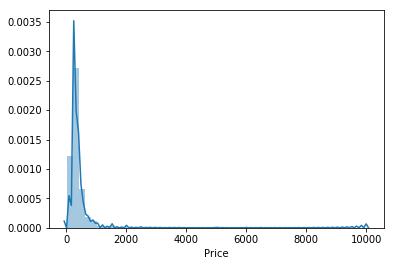

In [26]:
sns.distplot(df['Price'])

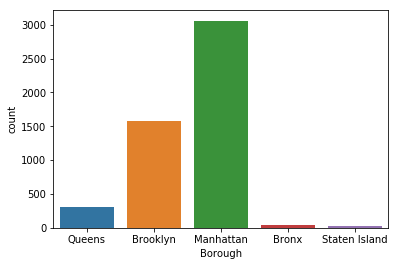

In [27]:
#This shows the graph for Borough vs the count where Manhattan has the maximum number of houses listed on the website
sns.countplot(x='Borough', data=df)

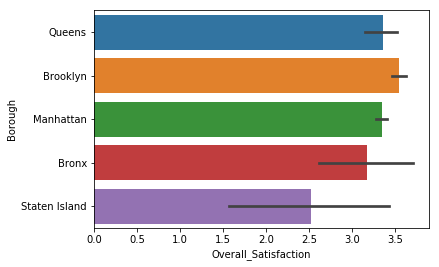

In [28]:
#This shows the bar plot for Overall satisfaction vs Borough where it states that Brooklyn houses provide better overall satisfaction than the rest 
sns.barplot(x='Overall_Satisfaction',y='Borough', data=df)

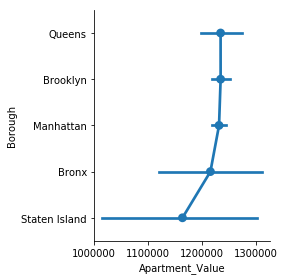

In [29]:
#This is the factor plot for Apartment value vs Borough where the price of houses in Queens is maximum
sns.factorplot(x='Apartment_Value',y='Borough', data=df)

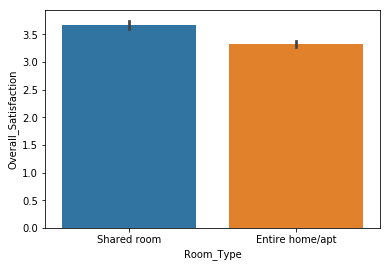

In [30]:
#This is the bar plot for Room type vs Overall satisfaction where it shows that shared room are rated above enitre home/apt
sns.barplot(x='Room_Type',y='Overall_Satisfaction',data=df)

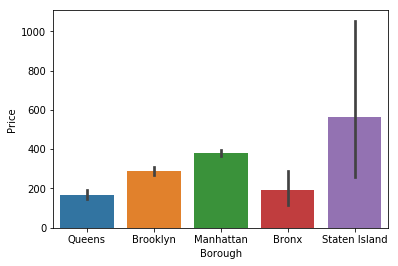

In [31]:
#This is the bar plot for Borough vs mean prices where Staten Island houses have maximum mean prices

sns.barplot(x='Borough',y='Price',data=df)

In [32]:
#From scikit learn import train test split function to split the data into two parts called train and test data

from sklearn.cross_validation import train_test_split

C:\Users\soham\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



In [33]:
#In this as shown in figure the independent variables are assigned X and the value to be predicted is y
#Now using the train test split in that the test_size=0.3 means that the 30% of data will be used as train data and 70% data as test
X=df[['House_Age','Number_of_Rooms','Number_of_Bedrooms','Area_Population']]
y=df['Apartment_Value']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [34]:
#Again from scikit learn importing linear regression model from the library
from sklearn.linear_model import LinearRegression


In [35]:
#Creating an instance for linear regression
lm=LinearRegression()

In [36]:
#Now fitting the model for linear regression using the train data
lm.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [37]:
#This shows the coefficients of the linear regression model
lm.coef_

array([ 1.50364956e+05, -1.39922675e+04,  5.44907551e+04,  5.76977996e-02])

In [38]:
#This shows the intercept value of the linear regression model
lm.intercept_


194110.85169667425

In [39]:
# Now we can just create a data frame to store this values of coefficients in a data frame
cdf=pd.DataFrame(lm.coef_,X_train.columns,columns=['Coefficient'])

In [40]:
cdf

,Coefficient
House_Age,150364.956480
Number_of_Rooms,-13992.267465
Number_of_Bedrooms,54490.755128
Area_Population,0.057698


This above table shows that the if the values of all the other variables is kept constant,then a 1 unit increase in House_Age will case a increase of $150304 in apartment value. And so on

In [41]:
#Thus now predicting the model to check our predictions regarding our model
predict=lm.predict(X_test)

In [42]:
from plotly import __version__
import cufflinks as cf
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()


Text(0,0.5,'Predicted values')

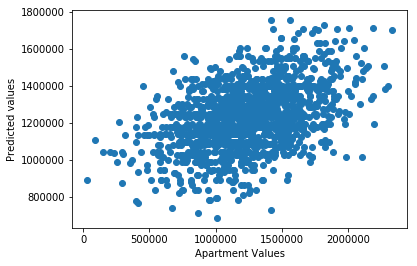

In [43]:

plt.scatter(y_test,predict)
plt.xlabel('Apartment Values')
plt.ylabel('Predicted values')

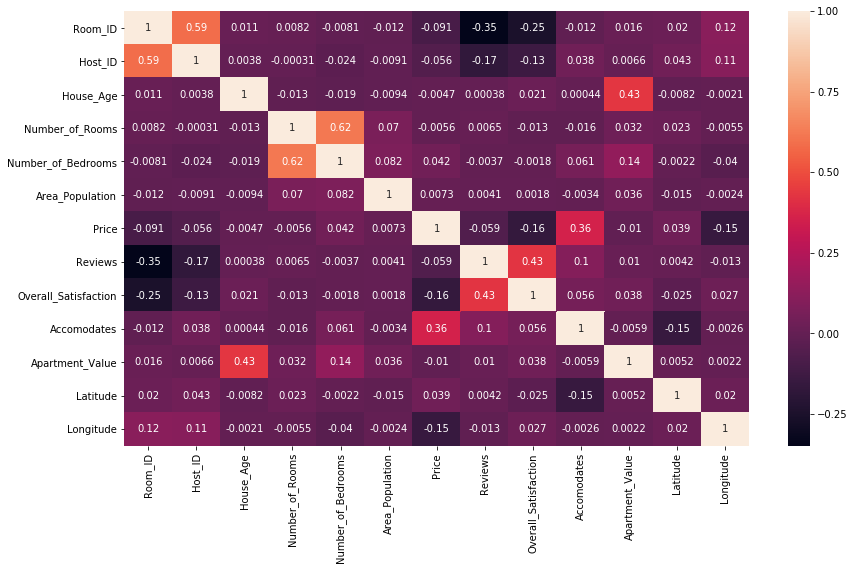

In [44]:
#This figure shows a correlations between different columns of the dataframe
plt.figure(figsize=(14,8))
sns.heatmap(df.corr(),annot=True)

In [45]:
#Now we are changing the value of room_type to binary 0,1 to use that as a categorical variable in logistic regression
df['Room_Type'].replace('Shared room', 0,inplace=True)

df['Room_Type'].replace('Entire home/apt', 1,inplace=True)

In [46]:
df.head()

,Room_ID,Host_ID,Room_Type,Property_Type,House_Age,Number_of_Rooms,Number_of_Bedrooms,Area_Population,Price,Reviews,Overall_Satisfaction,Accomodates,Apartment_Value,Borough,Neighborhood,Latitude,Longitude,Advertisement
0,7739955.0,38614070.0,0,House,6,1,1.0,23087.0,85.00000,6.0,4.0,4,1059034.0,Queens,Jackson Heights,40.749909,-73.876880,"Room TO SHARE by DAY,week,month"
1,7383173.0,32628813.0,0,House,6,2,3.0,40173.0,90.00000,14.0,4.0,6,1505891.0,Brooklyn,Cypress Hills,40.678527,-73.889584,Spacious Room: Close to Manhattan
2,10250852.0,35553123.0,0,House,6,9,7.0,36882.0,239.00000,3.0,4.0,6,1058988.0,Brooklyn,Sheepshead Bay,40.583041,-73.957976,COZY COUCH
3,2188359.0,5029659.0,0,Apartment,7,6,3.0,34310.0,165.00000,35.0,4.0,2,1260617.0,Manhattan,Hell's Kitchen,40.758374,-73.991955,1 Bdrm Apt 1 Block from Times Sq.
4,19661354.0,70038324.0,0,Apartment,5,1,1.0,26354.0,337.30028,0.0,1.0,2,630943.0,Manhattan,Upper East Side,40.761960,-73.959733,NYC Upper East / Midtown East Luxury 1BR


In [47]:
X=df[['Number_of_Rooms','Area_Population','Price','Accomodates']]
y=df['Room_Type']

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3)

In [48]:
from sklearn.linear_model import LogisticRegression

In [49]:
log=LogisticRegression()

In [50]:
log.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [51]:
predicts=log.predict(X_test)

In [52]:
from sklearn.metrics import classification_report,confusion_matrix

In [53]:
print(classification_report(y_test,predicts))
print('\n')
print(confusion_matrix(y_test,predicts))

             precision    recall  f1-score   support

          0       0.99      0.42      0.59       358
          1       0.85      1.00      0.92      1142

avg / total       0.88      0.86      0.84      1500



[[ 151  207]
 [   1 1141]]


In [54]:
from sklearn.neighbors import KNeighborsClassifier

In [55]:
knn=KNeighborsClassifier(n_neighbors=1)

In [56]:
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=1, p=2,
           weights='uniform')

In [57]:
predict=knn.predict(X_test)

In [58]:
print(classification_report(y_test,predicts))
print('\n')
print(confusion_matrix(y_test,predicts))


             precision    recall  f1-score   support

          0       0.99      0.42      0.59       358
          1       0.85      1.00      0.92      1142

avg / total       0.88      0.86      0.84      1500



[[ 151  207]
 [   1 1141]]


In [72]:
from sklearn.neighbors import KNeighborsClassifier

In [73]:
knn=KNeighborsClassifier(n_neighbors=1)

In [74]:
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=1, p=2,
           weights='uniform')

In [75]:
predictionknn=knn.predict(X_test)

In [76]:
from sklearn.metrics import classification_report,confusion_matrix

In [78]:
print(classification_report(y_test,predictionknn))
print(confusion_matrix(y_test,predictionknn))

             precision    recall  f1-score   support

          0       0.91      0.84      0.88       358
          1       0.95      0.97      0.96      1142

avg / total       0.94      0.94      0.94      1500

[[ 302   56]
 [  30 1112]]


# ELBOW METHOD

We need to increase the precision for that we need to find a value of k such that the value for error is decreased and precision increases. So this can be achieved through elbow method

In [79]:
error_rate=[]
for i in range(1,40):
    KNN=KNeighborsClassifier(n_neighbors=i)
    KNN.fit(X_train,y_train)
    predict_i=KNN.predict(X_test)
    error_rate.append(np.mean(predict_i != y_test))

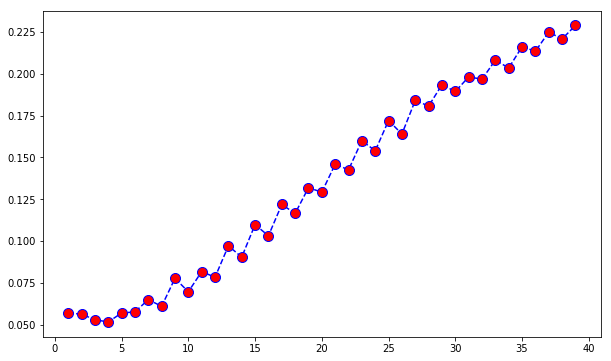

In [82]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='Blue',marker='o',linestyle='dashed',markerfacecolor='red',markersize=10)

This shows that value of k is minimum around value of k=3 or 4. So we can try with value of k=3 and 4 and see the value of precision

In [96]:
knn=KNeighborsClassifier(n_neighbors=4)

In [97]:
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=4, p=2,
           weights='uniform')

In [98]:
predictionknn=knn.predict(X_test)

In [99]:
print(classification_report(y_test,predictionknn))
print(confusion_matrix(y_test,predictionknn))

             precision    recall  f1-score   support

          0       0.92      0.86      0.89       358
          1       0.96      0.98      0.97      1142

avg / total       0.95      0.95      0.95      1500

[[ 308   50]
 [  28 1114]]


Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks, that operate by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. Random decision forests correct for decision trees' habit of overfitting to their training set.

In [100]:
from sklearn.tree import DecisionTreeClassifier

In [101]:
dtc=DecisionTreeClassifier()

In [102]:
dtc.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [103]:
pre=dtc.predict(X_test)

In [104]:
print(classification_report(y_test,pre))
print(confusion_matrix(y_test,pre))

             precision    recall  f1-score   support

          0       0.93      0.92      0.93       358
          1       0.97      0.98      0.98      1142

avg / total       0.96      0.96      0.96      1500

[[ 329   29]
 [  24 1118]]


In [105]:
from sklearn.ensemble import RandomForestClassifier

In [106]:
rfc=RandomForestClassifier(n_estimators=200)

In [107]:
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [108]:
pred5=rfc.predict(X_test)

In [109]:
print(classification_report(y_test,pred5))
print(confusion_matrix(y_test,pred5))

             precision    recall  f1-score   support

          0       0.96      0.96      0.96       358
          1       0.99      0.99      0.99      1142

avg / total       0.98      0.98      0.98      1500

[[ 345   13]
 [  16 1126]]


So, we can use this Random Forest Classifier for attaining more mode accuracy and precision, but also to avoid model overfitting.

## Conclusions ##

1) Apartment Value is related to No. of Bedrooms, House Age, No. of Rooms and Area Population

2) Customers prefer renting new houses as compared to older ones

3) When selecting a room or buying a house in NewYork people prefer areas like Manhattan and Brooklyn as compared to Staten Island and Bronx

4) Customers prefer the price of the rented rooms to be between $100-$500

5) Customers satisfaction rating for Shared Room is more than the ratings for an entire apartment